In [117]:
import spacy
import pandas as pd
from spacy.matcher import Matcher
from spacy_wordnet.wordnet_annotator import WordnetAnnotator 
nlp = spacy.load("en_core_web_sm")
nlp.add_pipe("merge_entities")
nlp.add_pipe("merge_noun_chunks")
import json
from matplotlib import pyplot as plt
import cv2
from elasticsearch import Elasticsearch
import re
from nltk.corpus import wordnet as wn

In [3]:
from elasticsearch import helpers
client = Elasticsearch(
    "http://localhost:9200",
     basic_auth=("elastic", "elastic")

)
resp = client.info()

In [101]:
class question_matcher:
    def __init__(self):
        self.patterns= []
        self.q_json = self.get_questions_json()
        self.matcher = Matcher(nlp.vocab)

    def get_questions_json(self):
        with open('questions.json', 'r') as f:
            pat = json.load(f)
        return pat
    
    def define_keyword(self,question:str):
        keyword = ''
        for q in self.q_json:
            if q['keyword'] in question.lower():
                keyword = q['keyword']
                index = q['qid']
        return keyword, index

    def re_get_focus(self,question:str,ind,pattern):
        question_token = [token.text for token in nlp(question)]
        focus = ''
        focus_pos = pattern['focus']
        start = 0
        i = 0
        for token in focus_pos[ind].split('\s*'):
                if(token == 'sf'):
                    start = 1
                    i = i - 1
                    continue

                if(token == 'ef'):
                    start = 0
                    break

                if(token == ".*" and start == 1):
                    j = i
                    while(j < len(question_token)):
                        focus = focus + ' ' + question_token[j]
                        j = j + 1
                    focus = focus.strip()
                    print(focus)
                    return focus

                if(start == 1):
                    focus = focus + ' ' + question_token[i]
                i = i + 1
        focus = focus.strip()
        print(focus)
        return focus

    def re_match_pattern(self,question):
        found = 0
        doc = nlp(question)
        ltoken = [token.pos_ for token in nlp(question)]
        q_pattern = ''
        for token in doc:
            q_pattern = q_pattern + token.pos_ + ' ' 
        keyword, index = self.define_keyword(question)
        for pattern in self.q_json[index]['patterns']:
            matched_pos=0
            for pos in pattern['pos']:
                regexpos  = f'({pos})'
                matches = re.fullmatch(regexpos, q_pattern)
                if matches != None:
                    print('Matched!')
                    print(matches.string)
                    print(pos)
                    print(pattern['pattern'])
                    focus = self.re_get_focus(question,matched_pos,pattern)
                    found = 1
                    return focus, pattern['answerType']
                matched_pos = matched_pos + 1
            if found == 1:
                break
 
    def pattern_to_pos(self, patterns:list):
        pos = []
        pattern = []
        for p in patterns:
            
            itr = []
            pattern.append(p)
            for token in p.split():
                if token != '*':
                    itr.append({'POS':token})
                else:
                    itr.append({})
            pos.append(itr)
        return pos
qm = question_matcher()


In [112]:

class retrive_image:
    def __init__(self):
        self.image_ids =[]
        self.image_caption =[]

    def search(self,query):
        self.image_ids =[]
        self.image_caption =[]
        query = {
            "match": {
            "caption": query
            }
        }
        resp = client.search(index="cocomo", query=query,size=100)
        print("Got %d Hits:" % resp['hits']['total']['value'])
        for hit in resp['hits']['hits']:
            #  print(\"%(caption)s : %(image_id)s : %(id)s\" % hit[\"_source\"])\n",
            self.image_ids.append(hit['_source']['image_id'])
            self.image_caption.append(hit['_source']['caption'])
       # self.display();
        
    def display(self):
        i = 0
        plt.figure(figsize=(25,50))
        columns = 2
        for i, id in enumerate(self.image_ids):
            plt.subplot(10, 3, i + 1)
            path = '..\\..\\Cocomo2014\\\\val2014\\\\val2014\\COCO_val2014_'+ '0'*(12 - len(str(id))) + str(id) +'.jpg'
            img = cv2.imread(path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.title(self.image_caption[i])
            plt.imshow(img)
ir = retrive_image()


In [40]:
class system:
    def __init__(self):
        qm = question_matcher()
        ir = retrive_image()
        self.image_captions = []
        self.image_ids = []
       
    def search(self,question):
        focus,eat  =  qm.re_match_pattern(question)
        print(focus)
        ir.search(focus)
        self.image_captions = ir.image_caption
        self.image_ids = ir.image_ids
s = system()

Matched!
PRON AUX NOUN ADP PROPN 
\s*PRON\s*AUX\s*(NOUN|PROPN)\s*.*\s*
who [is,was] [NAME]
the president of united states
the president of united states
Got 10000 Hits:


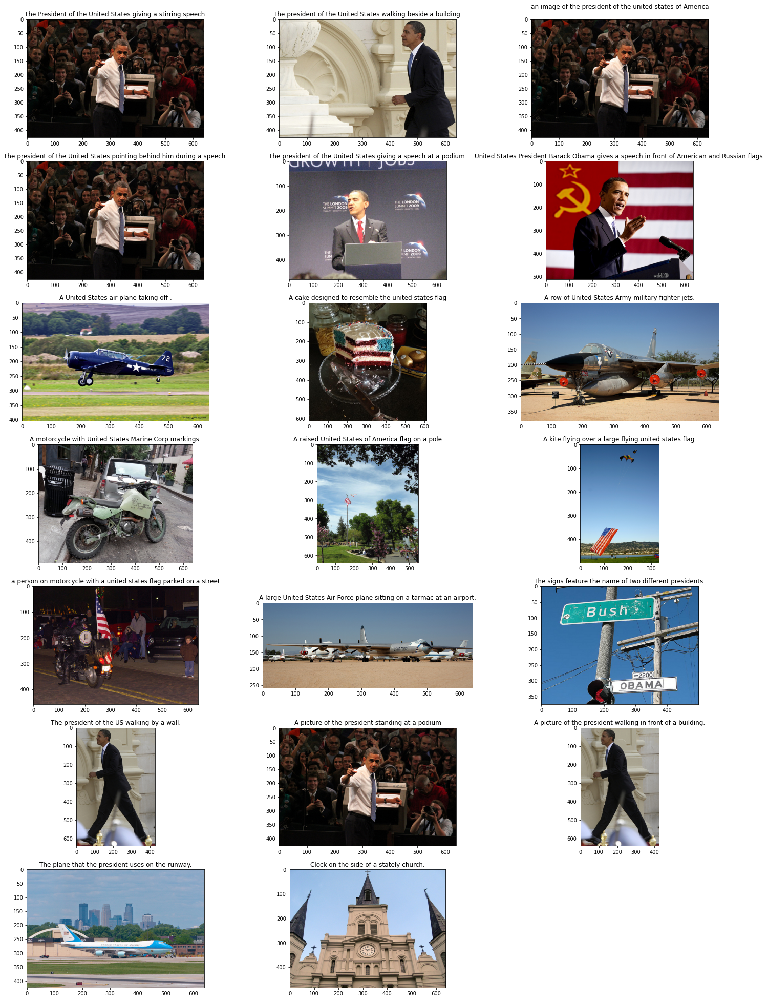

In [41]:
s.search('who is the president of united states')

In [150]:
class system1:
    def __init__(self):
        qm = question_matcher()
        ir = retrive_image()
        self.image_captions = []
        self.image_ids = []
    
    def search(self,question):
        focus, eat =  qm.re_match_pattern(question)
        print(focus)
        ir.search(focus)
        print(eat)
        self.image_captions = ir.image_caption
        self.image_ids = ir.image_ids
        self.data = pd.DataFrame({"caption":self.image_captions, "id":self.image_ids, "rank":[0]*len(self.image_ids)})
        self.get_image_with_correct_synset(eat)
        self.data = self.data.sort_values(by='rank',ascending=False)
        self.data.reset_index()
        self.display(self.data.head(100)['caption'],self.data.head(100)['id'])
        

    def get_image_with_correct_synset(self, eat:str):
        for index, row in self.data.iterrows():
            for word in row['caption'].split():
                if(self.check_hypernym(word, eat)):
                    self.data.at[index, 'rank'] = 1
                   
       # return aftercap, afterids
        
    def check_hypernym(self ,word:str ,set:str):
        word = nlp(word)[0].lemma_
        if(wn.synsets(word) == []):
            return False
        wordsynset = wn.synsets(word)[0]
        synset = [synset.name() for synset in wn.synset(wordsynset.name()).hypernym_paths()[0]]
        for s in synset:
            if(set in s.split('.')):
                return True
        return False



    def display(self,caps,ids):
        i = 0
        plt.figure(figsize=(25,100))
        columns = 2
        for i, id in enumerate(ids):
            plt.subplot(34, 3, i + 1)
            path = '..\\..\\Cocomo2014\\\\val2014\\\\val2014\\COCO_val2014_'+ '0'*(12 - len(str(id))) + str(id) +'.jpg'
            img = cv2.imread(path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.title(caps[i])
            plt.imshow(img)
s1 = system1()

Matched!
SCONJ AUX PROPN 
\s*SCONJ\s*AUX\s*(NOUN|PROPN)\s*
where is [ENTITY]
london
london
Got 81 Hits:
location


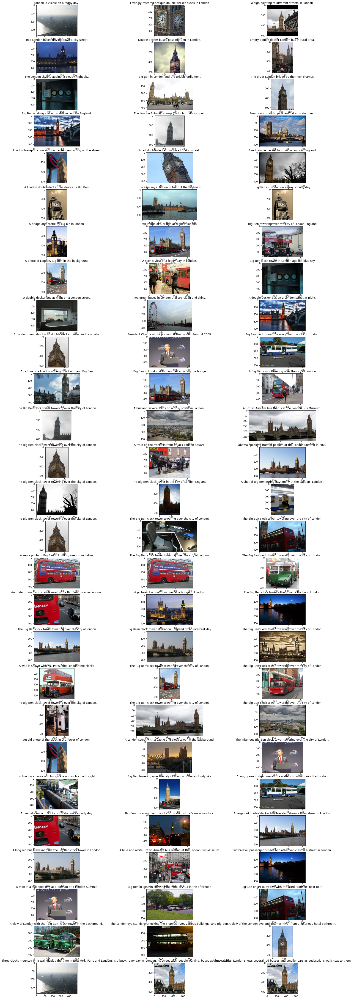

In [152]:
s1.search('where is london')

In [42]:
caps = s.image_captions
ids = s.image_ids

In [43]:
print(caps)

['The President of the United States giving a stirring speech.', 'The president of the United States walking beside a building.', 'an image of the president of the united states of America\n', 'The president of the United States pointing behind him during a speech.', 'The president of the United States giving a speech at a podium.', 'United States President Barack Obama gives a speech in front of American and Russian flags.', 'A United States air plane taking off .', 'A cake designed to resemble the united states flag', 'A row of United States Army military fighter jets.', 'A motorcycle with United States Marine Corp markings.', 'A raised United States of America flag on a pole', 'A kite flying over a large flying united states flag.', 'a person on motorcycle with a united states flag parked on a street', 'A large United States Air Force plane sitting on a tarmac at an airport.', 'The signs feature the name of two different presidents.', 'The president of the US walking by a wall.', 'A

In [68]:
def check_synset(word:str ,set:str):
    word = nlp(word)[0].lemma_
    if( wn.synsets(word) == []):
        return False
    wordsynset = wn.synsets(word)[0]
    synset = [synset.name() for synset in wn.synset(wordsynset.name()).hypernym_paths()[0]]
    for s in synset:
        if(set in s.split('.')):
            return True
    return False

In [96]:
aftercap =[]
afterids = []
for i, c in enumerate(caps):
    for word in c.split():
        if(check_synset(word, "person")):
            aftercap.append(caps[i])
            afterids.append(ids[i])


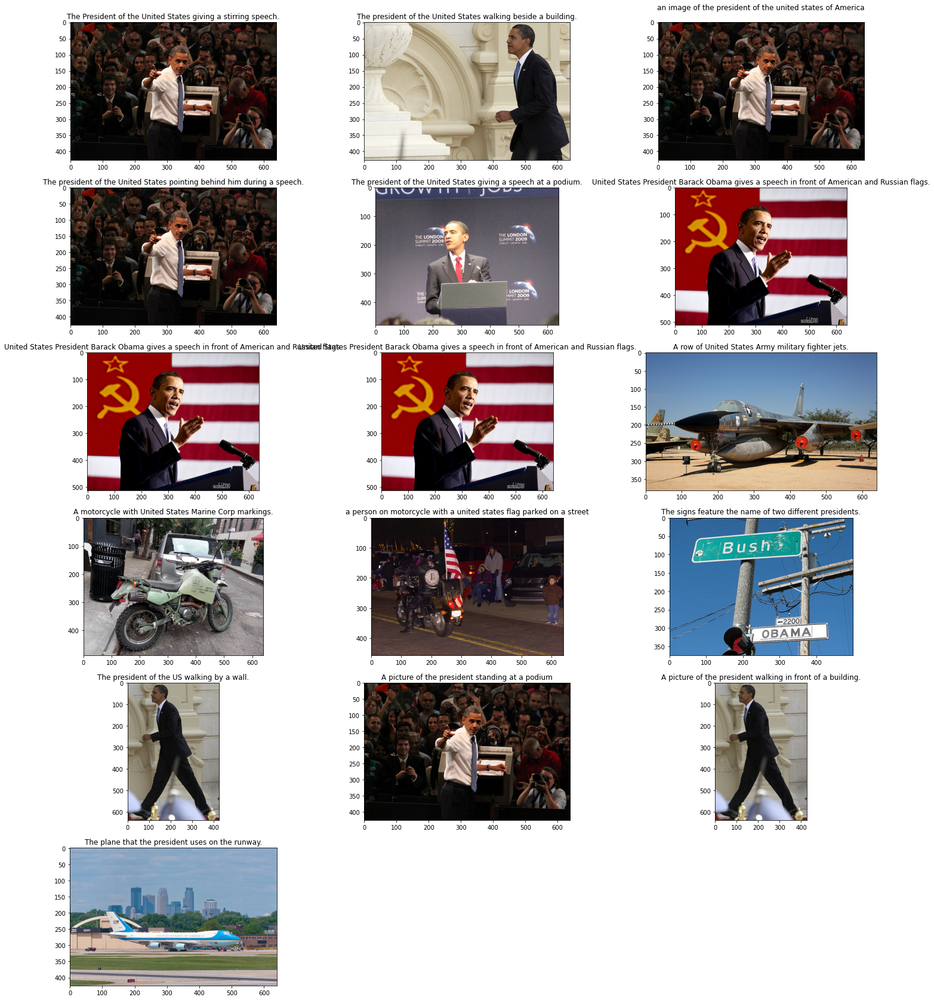

In [97]:
def display():
    i = 0
    plt.figure(figsize=(25,50))
    columns = 2
    for i, id in enumerate(afterids):
        plt.subplot(10, 3, i + 1)
        path = '..\\..\\Cocomo2014\\\\val2014\\\\val2014\\COCO_val2014_'+ '0'*(12 - len(str(id))) + str(id) +'.jpg'
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.title(aftercap[i])
        plt.imshow(img)
display()

In [111]:
wordsynset = wn.synsets('person')[0]
print(wordsynset)
[synset.name() for synset in wn.synset(wordsynset.name()).hypernym_paths()[0]]

Synset('person.n.01')


['entity.n.01', 'physical_entity.n.01', 'causal_agent.n.01', 'person.n.01']

In [95]:

vehicle = wn.synset('parent.n.01')
typesOfVehicles = list(set([w for s in vehicle.closure(lambda s:s.hyponyms()) for w in s.lemma_names()]))
print(typesOfVehicles)

['pop', 'pa', 'stepparent', 'para_I', 'mother-in-law', 'stepfather', 'adopter', 'dada', 'old_man', 'stepmother', 'father', 'supermom', 'mother', 'mama', 'father-in-law', 'dad', 'female_parent', 'mamma', 'pater', 'empty_nester', 'surrogate_mother', 'pappa', 'filicide', 'adoptive_parent', 'quadripara', 'mummy', 'mum', 'puerpera', 'mom', 'mammy', 'begetter', 'mommy', 'mater', 'papa', 'quintipara', 'male_parent', 'ma', 'daddy', 'primipara', 'momma']


In [12]:
def synonym_antonym_extractor(phrase):
     from nltk.corpus import wordnet
     synonyms = []
     antonyms = []

     for syn in wordnet.synsets(phrase):
          for l in syn.lemmas():
               synonyms.append(l.name())
               if l.antonyms():
                    antonyms.append(l.antonyms()[0].name())
     print(set(synonyms))
synonym_antonym_extractor(phrase="car")

{'railroad_car', 'auto', 'motorcar', 'gondola', 'machine', 'elevator_car', 'railway_car', 'cable_car', 'automobile', 'railcar', 'car'}


In [70]:
doc = nlp('micheal jackson giving a speech')
print([(X.text, X.label_) for X in doc.ents])

[('micheal jackson', 'PERSON')]


In [75]:
[synset.name() for synset in wn.synset('yesterday.n.01').hypernym_paths()[0]]

['entity.n.01',
 'abstraction.n.06',
 'measure.n.02',
 'time_unit.n.01',
 'day.n.01',
 'yesterday.n.01']